In [ ]:
import numpy as np
import pandas as pd


#visualizations
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

#time series import 
import statsmodels.api as sm

#statistics
from scipy import stats

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
df = pd.read_csv('/content/coinbaseUSD_1-min_data_2014-12-01_to_2018-01-08.csv')

In [ ]:
#Checking few values
df.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,1417411980,300.0,300.0,300.0,300.0,0.01,3.0,300.0
1,1417412040,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2,1417412100,300.0,300.0,300.0,300.0,0.01,3.0,300.0
3,1417412160,300.0,300.0,300.0,300.0,0.01,3.0,300.0
4,1417412220,300.0,300.0,300.0,300.0,0.01,3.0,300.0


In [ ]:
#Checking basic information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1574274 entries, 0 to 1574273
Data columns (total 8 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Timestamp          1574274 non-null  int64  
 1   Open               1574274 non-null  float64
 2   High               1574274 non-null  float64
 3   Low                1574274 non-null  float64
 4   Close              1574274 non-null  float64
 5   Volume_(BTC)       1574274 non-null  float64
 6   Volume_(Currency)  1574274 non-null  float64
 7   Weighted_Price     1574274 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 96.1 MB


In [ ]:
#Checking the basic statistics of the dataset
df.describe()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
count,1.574274e+06,1.574274e+06,1.574274e+06,1.574274e+06,1.574274e+06,1.574274e+06,1.574274e+06,1.574274e+06
mean,1.468131e+09,1.705118e+03,1.706025e+03,1.704113e+03,1.705123e+03,7.073412e+00,2.267928e+04,1.705069e+03
std,2.728500e+07,3.059038e+03,3.061434e+03,3.056505e+03,3.059105e+03,1.698569e+01,1.225156e+05,3.058976e+03
min,1.417412e+09,6.000000e-02,6.000000e-02,6.000000e-02,6.000000e-02,1.000000e-08,2.641700e-06,6.000000e-02
25%,1.444527e+09,2.903000e+02,2.904100e+02,2.901800e+02,2.903000e+02,6.915000e-01,3.162361e+02,2.903031e+02
50%,1.468141e+09,5.900500e+02,5.902100e+02,5.899800e+02,5.900200e+02,2.381500e+00,1.398624e+03,5.900207e+02
75%,1.491756e+09,1.224490e+03,1.224810e+03,1.224090e+03,1.224490e+03,7.032457e+00,7.601787e+03,1.224453e+03
max,1.515370e+09,1.989199e+04,1.989199e+04,1.989198e+04,1.989199e+04,1.563267e+03,1.997076e+07,1.989199e+04


In [ ]:
#Checking if there are NA values
df.isna().sum()

Timestamp            0
Open                 0
High                 0
Low                  0
Close                0
Volume_(BTC)         0
Volume_(Currency)    0
Weighted_Price       0
dtype: int64

## Auto Visualisation

  Cloning git://github.com/AutoViML/AutoViz.git to /tmp/pip-req-build-rbqq6ear
  Running command git clone -q git://github.com/AutoViML/AutoViz.git /tmp/pip-req-build-rbqq6ear
     |████████████████████████████████| 3.1 MB 7.7 MB/s 
     |████████████████████████████████| 132 kB 66.9 MB/s 
  Created wheel for autoviz: filename=autoviz-0.1.2-py3-none-any.whl size=50255 sha256=5cfb842e6a1d97c5b0ffd1a1ecdc02644b74d1ed7ebfee2cc1f429b7317d2fd1
  Stored in directory: /tmp/pip-ephem-wheel-cache-06zh313i/wheels/4a/57/9b/61ec5141526022ad5f7f6871ecff35f47c6cf8e21f9ed983dd
Successfully built autoviz


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
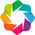

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
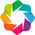

Imported AutoViz_Class version: 0.1.00. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Note: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
    Since nrows is smaller than dataset, loading random sample of 300000 rows into pandas...
Shape of your Data Set loaded: (300000, 8)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  0
    Number of String-Categ

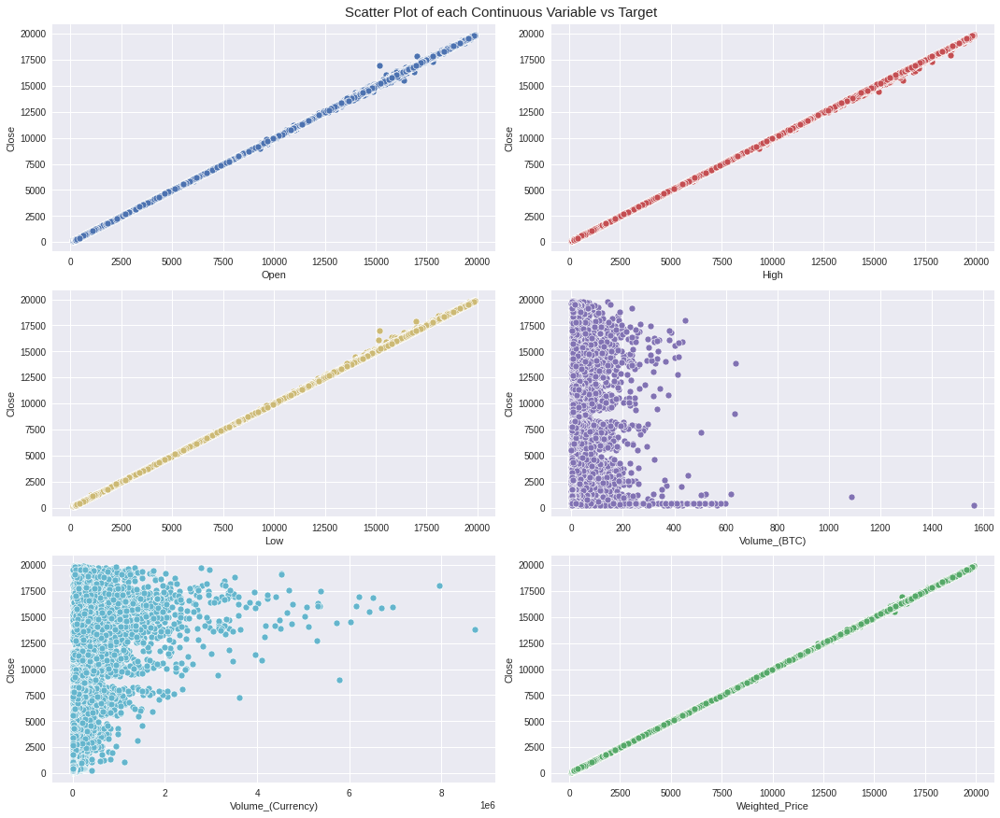

Number of All Scatter Plots = 21


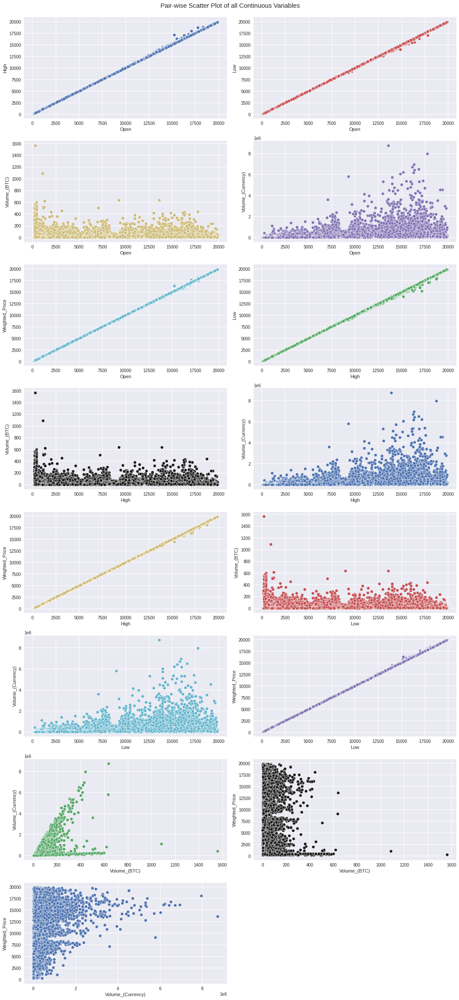

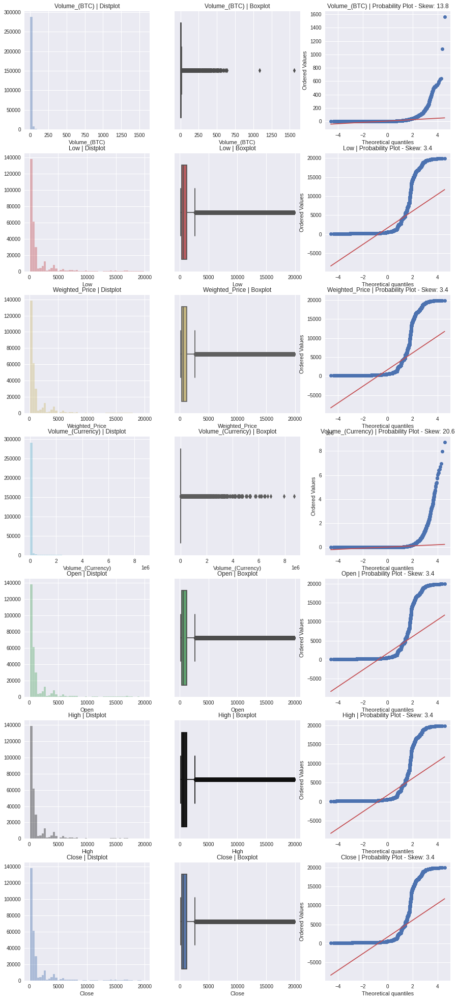

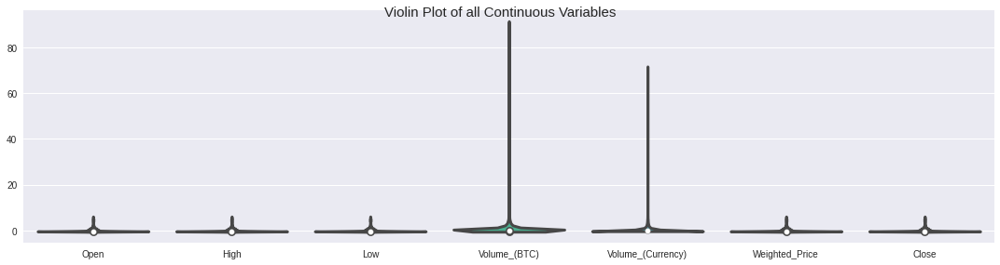

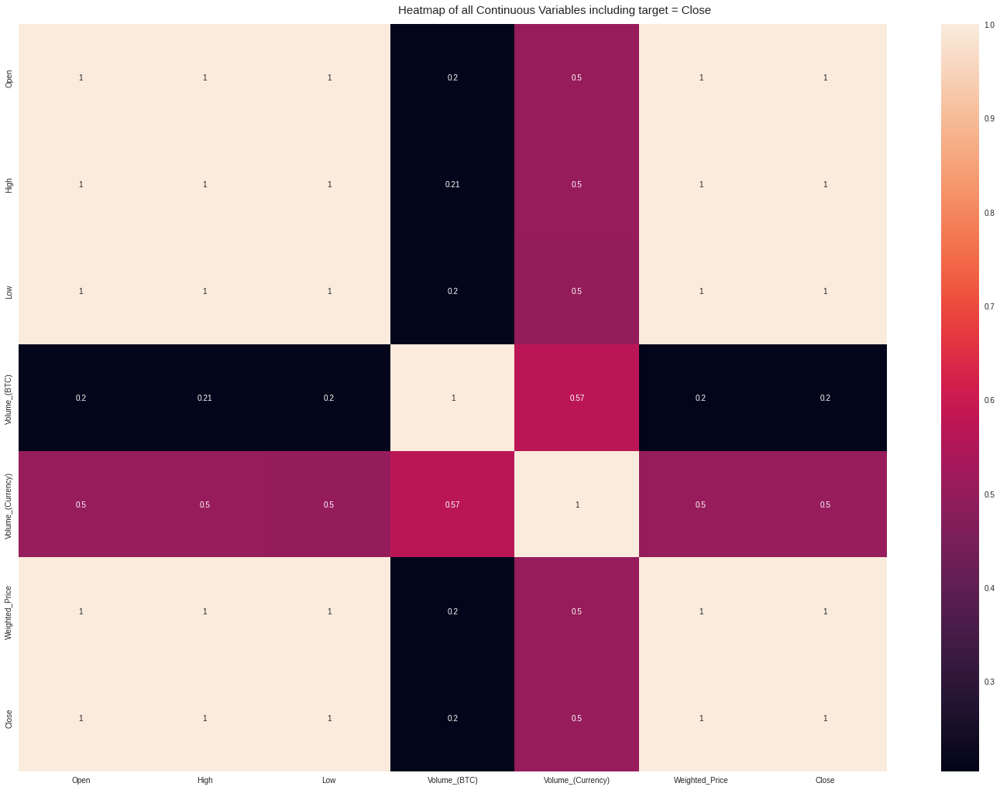

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz (in seconds) = 41

 ###################### VISUALIZATION Completed ########################


In [ ]:
!pip install git+git://github.com/AutoViML/AutoViz.git
!pip install xlrd

from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
dftc = AV.AutoViz(
    filename='', 
    sep='' , 
    depVar='Close', 
    dfte=df, 
    header=0, 
    verbose=1, 
    lowess=False, 
    chart_format='png', 
    max_rows_analyzed=300000,
    max_cols_analyzed=30
)

In [ ]:
# Converting the data into time-series dataset

df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='s')
df.set_index(df['Timestamp'], inplace=True)

df.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,,
2014-12-01 05:33:00,2014-12-01 05:33:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:34:00,2014-12-01 05:34:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:35:00,2014-12-01 05:35:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:36:00,2014-12-01 05:36:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:37:00,2014-12-01 05:37:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0


In [ ]:
# Copying the data and filling the NA values (if any) using ffill method
data = df.copy()
data['Volume_(BTC)'].fillna(method='ffill', inplace=True)
data['Volume_(Currency)'].fillna(method='ffill', inplace=True)
data['Weighted_Price'].fillna(method='ffill', inplace=True)
data['Open'].fillna(method='ffill', inplace=True)
data['High'].fillna(method='ffill', inplace=True)
data['Low'].fillna(method='ffill', inplace=True)
data['Close'].fillna(method='ffill', inplace=True)

data.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
Timestamp,,,,,,,,
2014-12-01 05:33:00,2014-12-01 05:33:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:34:00,2014-12-01 05:34:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:35:00,2014-12-01 05:35:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:36:00,2014-12-01 05:36:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
2014-12-01 05:37:00,2014-12-01 05:37:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0


## Resampling to generate dataset of different frequency


In [ ]:
# Resampling to daily frequency
data_day = data.resample('D').mean()

# Resampling to monthly frequency
data_month = data.resample('M').mean()

# Resampling to hourly frequency
data_hour = data.resample('H').mean()

# Resampling to annual frequency
data_annual = data.resample('A-DEC').mean()

# Resampling to quarterly frequency
data_Q = data.resample('Q-DEC').mean()

## Visualing the newly sampled data

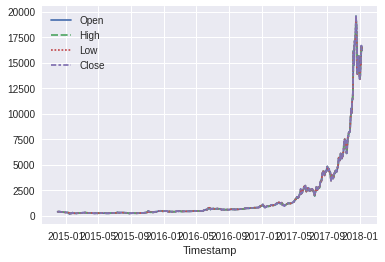

In [ ]:
seaborn_plot_data = data_day[["Open","High","Low","Close"]]
sns.lineplot(data=seaborn_plot_data)

In [ ]:
def frequency_bitcoin_plot(df, frequency):
  fig = make_subplots(rows=2, cols = 2, subplot_titles=("Open",'High','Low','Close'))

  #Add traces
  fig.add_trace(go.Scatter(x = df.index, y = df.Open, name = "Open"), row = 1, col = 1)
  fig.add_trace(go.Scatter(x = df.index, y = df.High, name = "High"), row = 1, col = 2)
  fig.add_trace(go.Scatter(x = df.index, y = df.Low, name = "Low"), row = 2, col = 1) 
  fig.add_trace(go.Scatter(x = df.index, y = df.Close, name = "Close"), row = 2, col = 2)

  #Update x-axis properties
  fig.update_xaxes(title_text = "Timestamp", row = 1, col = 1)
  fig.update_xaxes(title_text = "Timestamp", row = 1, col = 2)
  fig.update_xaxes(title_text = "Timestamp", row = 2, col = 1)
  fig.update_xaxes(title_text = "Timestamp", row = 2, col = 2)

  #Update y-axis properties
  fig.update_yaxes(title_text = "Open", row = 1, col = 1)
  fig.update_yaxes(title_text = "High", row = 1, col = 2)
  fig.update_yaxes(title_text = "Low", row = 2, col = 1)
  fig.update_yaxes(title_text = "Close", row = 2, col = 2)

  #Adjusting title and height
  fig.update_layout(title_text = f"Bitcoin values with {frequency} frequency", height = 700)

  fig.show()

In [ ]:
seaborn_plot_data_month = data_month[["Open","High","Low","Close"]]
seaborn_plot_data_hour = data_hour[["Open","High","Low","Close"]]
seaborn_plot_data_year = data_annual[["Open","High","Low","Close"]]
seaborn_plot_data_Q = data_Q[["Open","High","Low","Close"]]

In [ ]:
frequency_bitcoin_plot(seaborn_plot_data_hour, "hour")

In [ ]:
frequency_bitcoin_plot(seaborn_plot_data, "day")

In [ ]:
frequency_bitcoin_plot(seaborn_plot_data_month, "monthly")

In [ ]:
frequency_bitcoin_plot(seaborn_plot_data_Q, "Quarter")

In [ ]:
frequency_bitcoin_plot(seaborn_plot_data_year, "annual")

## Seasonality

In [ ]:
seasonal_data = seaborn_plot_data_month.copy()

In [ ]:
seasonal_data['Timestamp'] = seasonal_data.index

In [ ]:
seasonal_data['year'] = pd.DatetimeIndex(seasonal_data['Timestamp']).year
seasonal_data['month'] = pd.DatetimeIndex(seasonal_data['Timestamp']).month
seasonal_data.head()

,Open,High,Low,Close,Timestamp,year,month
Timestamp,,,,,,,
2014-12-31,374.164240,374.164543,374.162780,374.163084,2014-12-31,2014,12
2015-01-31,230.321541,231.121367,229.001502,229.691078,2015-01-31,2015,1
2015-02-28,234.337118,234.479954,234.211641,234.347712,2015-02-28,2015,2
2015-03-31,269.905614,270.032707,269.783073,269.918531,2015-03-31,2015,3
2015-04-30,235.684638,235.755895,235.616258,235.690799,2015-04-30,2015,4


In [ ]:
p1_pivot = pd.pivot_table(seasonal_data, values = 'Open', index = ['month'],columns= ['year'], aggfunc=np.mean)
p2_pivot = pd.pivot_table(seasonal_data, values = 'Close', index = ['month'],columns= ['year'], aggfunc=np.mean)
p3_pivot = pd.pivot_table(seasonal_data, values = 'High', index = ['month'],columns= ['year'], aggfunc=np.mean)
p4_pivot = pd.pivot_table(seasonal_data, values = 'Low', index = ['month'],columns= ['year'], aggfunc=np.mean)

In [ ]:
pivot_list = [p1_pivot, p2_pivot, p3_pivot, p4_pivot]
for pivot_choice in pivot_list:
  pivot_choice['Max'] = pivot_choice.iloc[:,-5:].max(axis = 1)
  pivot_choice['Min'] = pivot_choice.iloc[:,-5:].min(axis = 1)
  pivot_choice['5 Year Avg'] = pivot_choice.iloc[:,-5:].mean(axis = 1)
  pivot_choice['7 Year Avg'] = pivot_choice.iloc[:,-5:].mean(axis = 1)

In [ ]:
p1_fig = go.Figure()
p2_fig = go.Figure()
p3_fig = go.Figure()
p4_fig = go.Figure()
p5_fig = go.Figure()
total_fig = go.Figure()

# Set up lists to iterate through
fig_list = [p1_fig, p2_fig, p3_fig, p4_fig]
pivot_list = [p1_pivot, p2_pivot, p3_pivot, p4_pivot]
title_list = ['Open','Close','High',
              'Low']

# Set the colors for the lines
#colors = ['#17becf','#e377c2','#ff7f0e','#2ca02c']

# Create x-axis labels for the months
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

# Create the Graphs
for j in range(4):
    data = pivot_list[j]

    fig_list[j].add_trace(go.Scatter(x=months, y=data['Max'],
        fill=None,
        mode=None,
        line_color='lightgray', showlegend=False
        ))
    fig_list[j].add_trace(go.Scatter(x=months, y=data['Min'],
        fill='tonexty', # fill area between trace0 and trace1
        mode=None, line_color='lightgray', showlegend=False))

    fig_list[j].add_trace(go.Scatter(x=months, y=data['5 Year Avg'], name='5 Year Avg',
                                 line=dict(color='black', width=4, dash='dot')))
    fig_list[j].add_trace(go.Scatter(x=months, y=data['7 Year Avg'], name='7 Year Avg',
                                 line=dict(color='grey', width=4, dash='dashdot')))

    for i in range(1,9):
        fig_list[j].add_trace(go.Scatter(x=months, y=data.iloc[:,i], name=data.columns[i],
                                 line=dict(width=4)))         #color=colors[i],

    fig_list[j].update_layout(title=title_list[j],
                       xaxis_title='Month',
                       yaxis_title='Price Unit', template='plotly_white')
    
# Show all the graphs
p1_fig.show()
p2_fig.show()
p3_fig.show()
p4_fig.show()



*   5 year average shows that the price was higher around January and December.
*   7 year average shows that the price was higher around January and December.




## Time Series Forecasting Method

### Checking the stationarity of the data set

In [ ]:
data_day["Close"]=data_day["Close"].fillna(method="ffill")

Dicey-Fuller test: p=1.000000


<Figure size 1080x504 with 0 Axes>

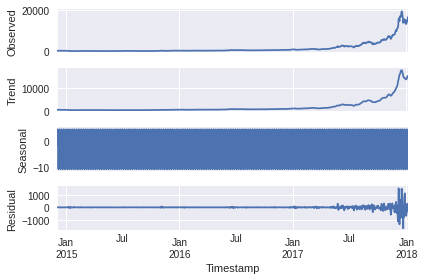

In [ ]:
plt.figure(figsize=[15,7])
sm.tsa.seasonal_decompose(data_day["Close"]).plot()
print("Dicey-Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_day["Close"])[1])
plt.show()

##### As is clear from the graph above the series is not stationary.

### Seasonal Differentiation

In [ ]:
data_day["Close_season_diff_1"] = data_day["Close"] - data_day["Close"].shift(12)
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_day.Close_season_diff_1[12:])[1])

Dickey–Fuller test: p=0.000000


###### Hence, the series is seasonally stationary.
 

Dickey–Fuller test: p=0.000000


<Figure size 1080x504 with 0 Axes>

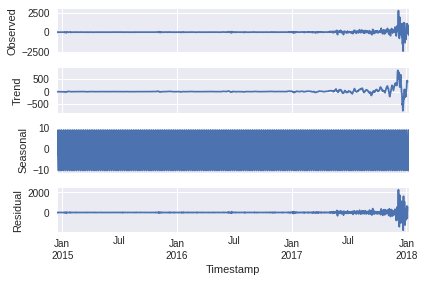

In [ ]:
# Regular differentiation
data_day["Close_diff_1"] = data_day["Close"] - data_day["Close"].shift(1)
plt.figure(figsize=(15, 7))

# STL-decomposition
sm.tsa.seasonal_decompose(data_day["Close_diff_1"][13:]).plot()   
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(data_day["Close_diff_1"][13:])[1])

plt.show()

*   Probably, the series looks stationary due to over-differentiation.

## Auto Regressive Integrated Moving Average Model


*   ARIMA, short for ‘Auto Regressive Integrated Moving Average’ is actually a class of models that ‘explains’ a given time series based on its own past values, that is, its own lags and the lagged forecast errors, so that equation can be used to forecast future values.
*   Any ‘non-seasonal’ time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.



In [ ]:
data_day['Close']

Timestamp
2014-12-01      366.775068
2014-12-02      375.943056
2014-12-03      377.882701
2014-12-04      377.991743
2014-12-05      377.991743
                  ...     
2018-01-04    14851.726771
2018-01-05    15797.656597
2018-01-06    16662.248528
2018-01-07    16526.662882
2018-01-08    16174.220000
Freq: D, Name: Close, Length: 1135, dtype: float64

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

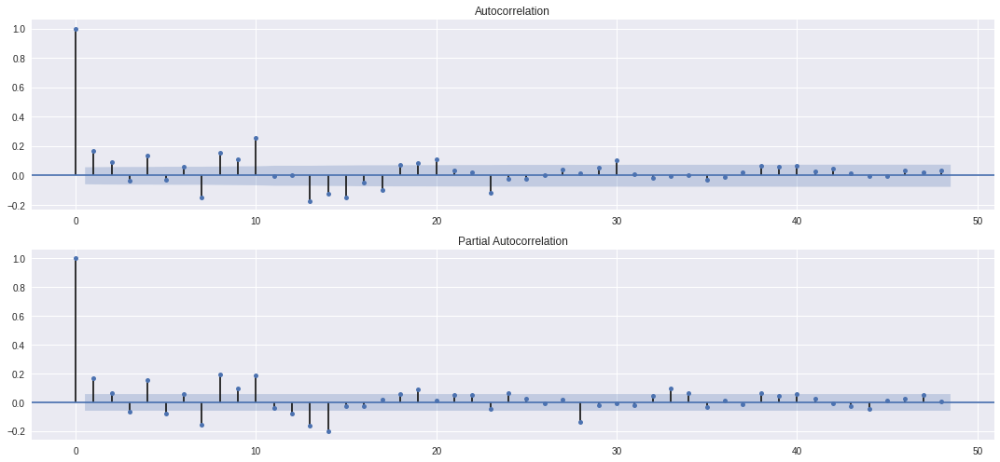

In [ ]:
# Initial approximation of parameters using Autocorrelation and Partial Autocorrelation Plots
plt.figure(figsize=(15,7))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(data_day["Close_diff_1"][13:].values.squeeze(), lags=48, ax=ax)
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(data_day["Close_diff_1"][13:].values.squeeze(), lags=48, ax=ax)
plt.tight_layout()
plt.show()

In [ ]:
from itertools import product
# Initial approximation of parameters
Qs = range(0, 2)
qs = range(0, 3)
Ps = range(0, 3)
ps = range(0, 3)
D = 1
d = 1
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

54

## General Auto Regressive Integrated Moving Average Model

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

## 1,1,2 ARIMA Model
model = ARIMA(data_day['Close'], order = (1, 1, 2))
model_fit = model.fit(disp = 0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 1134
Model:                 ARIMA(1, 1, 2)   Log Likelihood               -7531.339
Method:                       css-mle   S.D. of innovations            185.356
Date:                Tue, 16 Nov 2021   AIC                          15072.679
Time:                        05:51:31   BIC                          15097.846
Sample:                    12-02-2014   HQIC                         15082.186
                         - 01-08-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            13.8444      7.017      1.973      0.049       0.092      27.597
ar.L1.D.Close    -0.9498      0.016    -58.691      0.000      -0.981      -0.918
ma.L1.D.Close     1.1880      0.033     

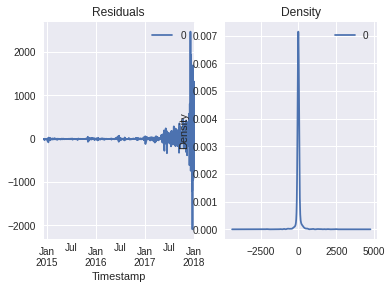

In [ ]:
# Plot depicting residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title = "Residuals", ax = ax[0])
residuals.plot(kind = 'kde', title = 'Density', ax = ax[1])
plt.show()

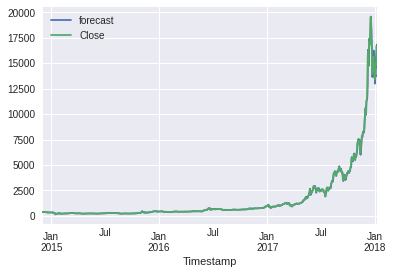

In [ ]:
# Actual vs Fitted
model_fit.plot_predict(dynamic=False)
plt.show()

In [ ]:
# Model Selection
results = []
best_aic = float("inf")
for param in parameters_list:
    try:
        model=sm.tsa.statespace.SARIMAX(data_day["Close"], order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1)
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])

In [ ]:
# Best Models
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(best_model.summary())

      parameters           aic
49  (2, 2, 0, 1)  14944.437304
53  (2, 2, 2, 1)  14962.302092
31  (1, 2, 0, 1)  14962.746173
35  (1, 2, 2, 1)  14966.671081
33  (1, 2, 1, 1)  14976.078638
                                 Statespace Model Results                                 
Dep. Variable:                              Close   No. Observations:                 1135
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood               -7466.219
Date:                            Tue, 16 Nov 2021   AIC                          14944.437
Time:                                    06:01:20   BIC                          14974.575
Sample:                                12-01-2014   HQIC                         14955.827
                                     - 01-08-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------

Dickey-Fuller test:: p =0.000000


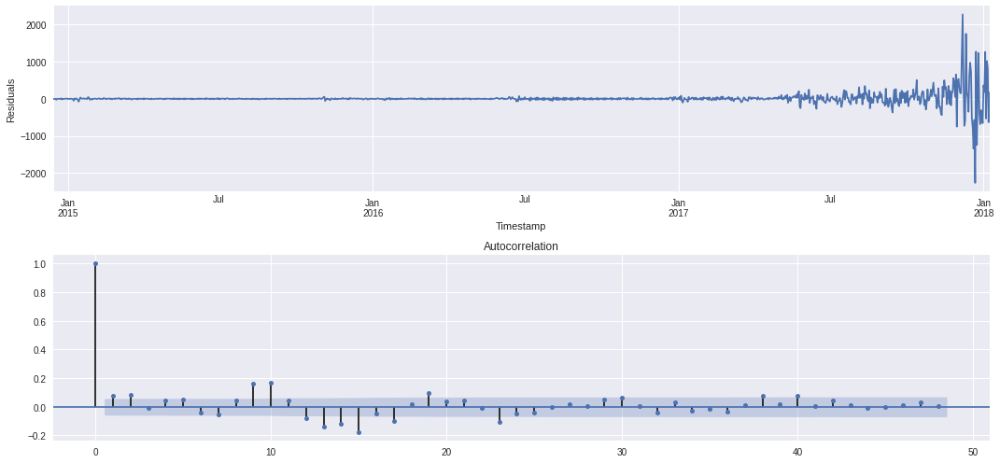

In [ ]:
# STL decomposition
plt.figure(figsize = (15, 7))
plt.subplot(211)
best_model.resid[13:].plot()
plt.ylabel(u'Residuals')
ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(best_model.resid[13:].values.squeeze(), lags = 48, ax = ax)
print("Dickey-Fuller test:: p =%f" % sm.tsa.stattools.adfuller(best_model.resid[13:])[1])
plt.tight_layout()
plt.show()

## Test Train Dataset

In [ ]:
split_size = int(0.8*len(data_day['Close'])) # 80% train, 20% test

# Train data (everything before the split)
X_train, y_train = data_day.index[:split_size], data_day['Close'][:split_size]

# Test data (everything after the split)
X_test, y_test = data_day.index[split_size:], data_day['Close'][split_size:]

len(X_train), len(X_test), len(y_train), len(y_test)

(908, 227, 908, 227)

In [ ]:
X_train

DatetimeIndex(['2014-12-01', '2014-12-02', '2014-12-03', '2014-12-04',
               '2014-12-05', '2014-12-06', '2014-12-07', '2014-12-08',
               '2014-12-09', '2014-12-10',
               ...
               '2017-05-17', '2017-05-18', '2017-05-19', '2017-05-20',
               '2017-05-21', '2017-05-22', '2017-05-23', '2017-05-24',
               '2017-05-25', '2017-05-26'],
              dtype='datetime64[ns]', name='Timestamp', length=908, freq='D')

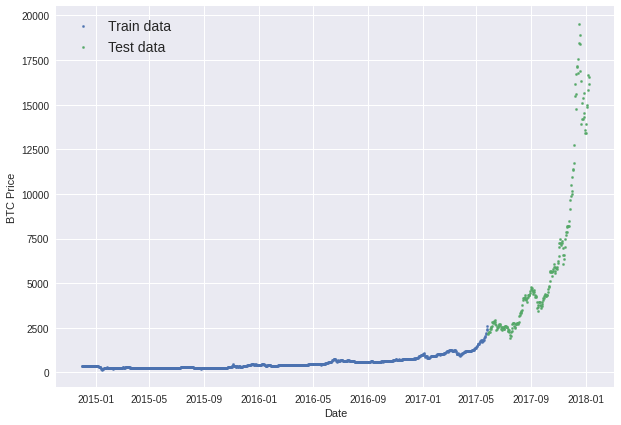

In [ ]:
# Plot depicting currently made splits
plt.figure(figsize= (10, 7))
plt.scatter(X_train, y_train, s = 5, label = 'Train data')
plt.scatter(X_test, y_test, s= 5, label = "Test data")
plt.xlabel("Date")
plt.ylabel("BTC Price")
plt.legend(fontsize = 14)
plt.show()

### Timeseries data plotting function

In [ ]:
def plot_time_series(timesteps, values, format = '.', start = 0, end = None, label = None):
  plt.plot(timesteps[start:end], values[start:end], format, label = label)
  plt.xlabel("Time")
  plt.ylabel("BTC Price")
  if label:
    plt.legend(fontsize=14)
  plt.grid(True)

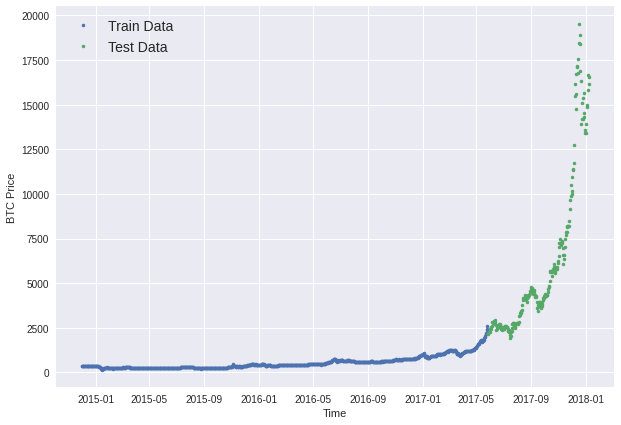

In [ ]:
plt.figure(figsize=(10,7))
plot_time_series(timesteps=X_train, values = y_train, label = 'Train Data')
plot_time_series(timesteps=X_test, values = y_test, label = 'Test Data')

## Forecast

In [ ]:
forecast = y_test[:-1]

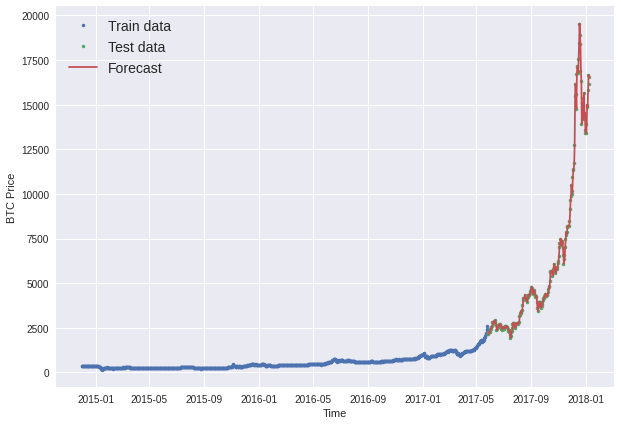

In [ ]:
plt.figure(figsize=(10, 7))
plot_time_series(timesteps=X_train, values = y_train, label = 'Train data')
plot_time_series(timesteps=X_test, values = y_test, label = 'Test data')
plot_time_series(timesteps=X_test[1:], values = forecast, format = '-', label = 'Forecast')

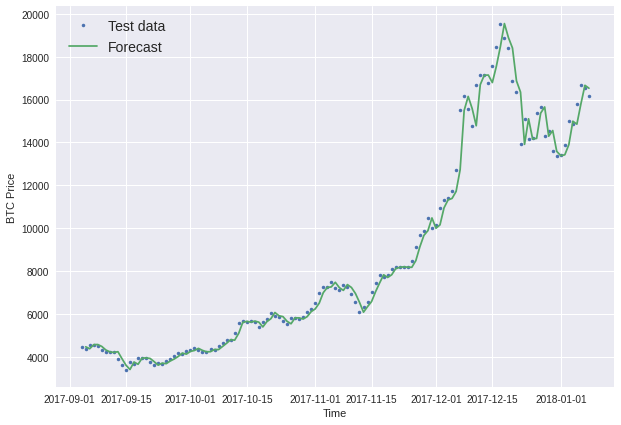

In [ ]:
plt.figure(figsize=(10, 7))
offset = 100 # offset the values by 100 timesteps 
plot_time_series(timesteps=X_test, values=y_test, start=offset, label="Test data")
plot_time_series(timesteps=X_test[1:], values=forecast, format="-", start=offset, label="Forecast");